## Highlights
---
- loading, saving, manipulating images
- dyadic operation
- gaussian kernel convolution
- working with raw images
- face detection using haar cascade

In [1]:
# lets import some images from google first
! wget -O cat.jpg https://icatcare.org/app/uploads/2018/07/Thinking-of-getting-a-cat.png
! wget -O dog.jpg https://e3.365dm.com/18/05/1600x900/skynews-greyhound-dog_4303007.jpg?20180506212301
# uncomment the following line and download an image of your choice
#! wget -O [name] [url]

--2021-02-03 01:24:08--  https://icatcare.org/app/uploads/2018/07/Thinking-of-getting-a-cat.png
Resolving icatcare.org (icatcare.org)... 142.93.47.206
Connecting to icatcare.org (icatcare.org)|142.93.47.206|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1246129 (1.2M) [image/png]
Saving to: ‘cat.jpg’

cat.jpg             100%[===================>]   1.19M  1.49MB/s    in 0.8s    

2021-02-03 01:24:10 (1.49 MB/s) - ‘cat.jpg’ saved [1246129/1246129]

--2021-02-03 01:24:10--  https://e3.365dm.com/18/05/1600x900/skynews-greyhound-dog_4303007.jpg?20180506212301
Resolving e3.365dm.com (e3.365dm.com)... 69.192.203.155, 2600:1409:d000:5a1::3757, 2600:1409:d000:599::3757
Connecting to e3.365dm.com (e3.365dm.com)|69.192.203.155|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 84996 (83K) [image/jpeg]
Saving to: ‘dog.jpg’

dog.jpg             100%[===================>]  83.00K  --.-KB/s    in 0.02s   

2021-02-03 01:24:11 (5.35 MB/s) - ‘dog.jpg’

In [2]:
# necessary imports
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
plt.style.use('seaborn')
%matplotlib inline
import cv2

In [3]:
# read the images into variables, can further add variables of your own images
img1 = cv2.imread('cat.jpg')
img2 = cv2.imread('dog.jpg')

In [4]:
# analysing the image array
print(type(img1))
print(img1.dtype)
print(img1.shape)
print(img1[0, 0, 0])  # printing the first element
print('range of values in the array: ({},{})'.format(np.min(img1), np.max(img1)))

<class 'numpy.ndarray'>
uint8
(600, 1200, 3)
56
range of values in the array: (0,255)


In [5]:
# visualizing the image using matplotlib
def vis_img(img):
  fig, axs = plt.subplots(1, 2, figsize=(16,9))  # guide for subplots : https://matplotlib.org/3.3.3/api/_as_gen/matplotlib.pyplot.subplots.html
  axs[0].imshow(img)
  axs[0].set_title('image displayed in BGR') # why BGR? 
  axs[1].imshow(img[:, :, ::-1])
  axs[1].set_title('image displayed in RGB')
  return fig

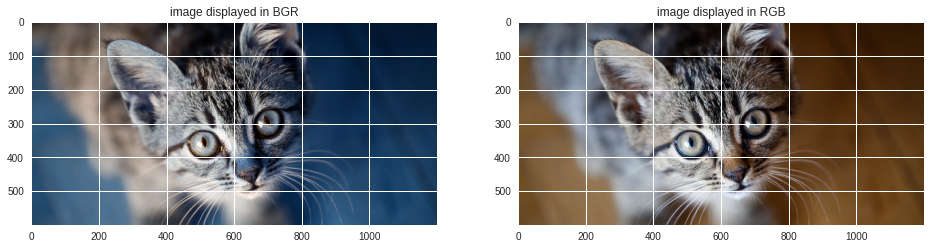

In [6]:
vis_img(img1).show()

In [7]:
# lets conert the images to float
img1 = (img1 / 255.0)
img2 = (img2 / 255.0)
print(img1.dtype)

float64


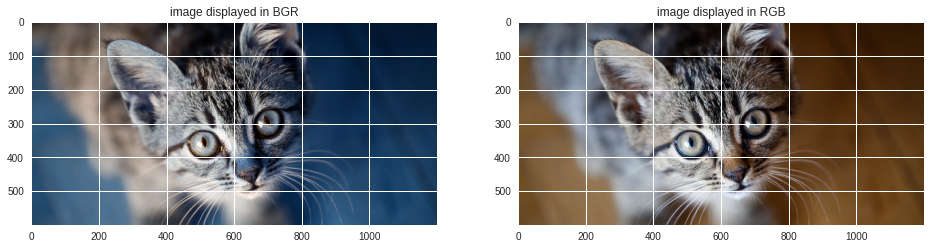

In [8]:
# visualizing the float 64
vis_img(img1).show()

In [9]:
# ideally remember to convert it to float32 format, and check if value is in 0 to 1 range.
img1 = np.float32(img1)
img2 = np.float32(img2)
print(img1.dtype)

float32


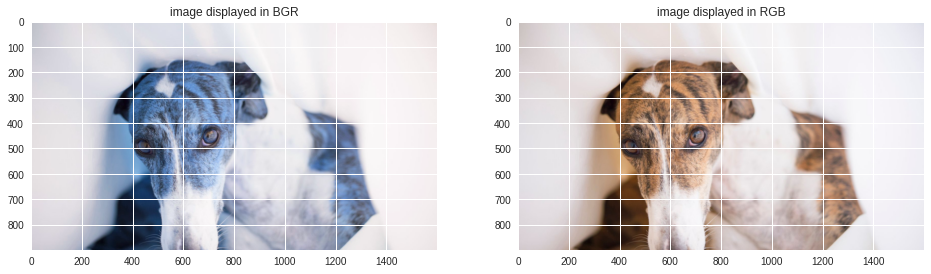

In [10]:
# visualizing the float 32
vis_img(img2).show()

## Dyadic/Linear_blend operator
- this is just one of many image processing operations and using here to just demo a use case
- Can be used to perform a cross dissolve transition between two images, as in slide shows
- refer to https://szeliski.org/Book/drafts/SzeliskiBook_20100903_draft.pdf | page 104 (chapter 3)
- The idea is to blend linearly between multiple images by setting the images to be function of x in the following function: 
$$g(x) = (1-\alpha )f_0(x) + \alpha f_1(x)$$

In [11]:
def linear_blend(img1, img2, alpha):
  # as we have different size images, we can use min of the two axis, this is similar to cropping with a window from top left corner
  # alternatively we can resize the images
  x_max = min(img1.shape[0], img2.shape[1])
  y_max = min(img1.shape[1], img2.shape[1])
  img1 = img1[0:x_max, 0:y_max]
  img2 = img2[0:x_max, 0:y_max]
  img = np.zeros_like((x_max, y_max))
  img = (1 - alpha) * img1 + alpha * img2
  return img

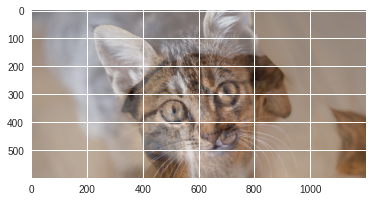

In [12]:
# testing the function
plt.imshow(linear_blend(img1, img2, 0.5)[:,:, ::-1])

# can save the result of linear_blend using imsave
plt.imsave('catdog.jpg', linear_blend(img1, img2, 0.5)[:,:, ::-1])

In [13]:
# creating a transition animation between the two images, importing the necessary modules below
# https://towardsdatascience.com/animations-with-matplotlib-d96375c5442c
from matplotlib import rc
rc('animation', html='jshtml')
import matplotlib.animation as animation

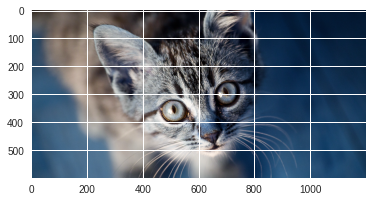

In [14]:
fig = plt.figure()
alpha = 0
ax = plt.imshow(img1)
def init():
  plot = ax.set_data(img1)
  return

def animate(i):
  img = linear_blend(img1, img2, i/100)
  plot = ax.set_data(img[:, :, ::-1])
  return

In [15]:
# matplotlib.rcParams['animation.embed_limit'] = 2**128
ani = animation.FuncAnimation(fig, animate, init_func=init, frames = 100, interval = 0.5, blit = False, repeat = False)

In [16]:
ani

## Implementing a Gaussian Smoothing filter
- https://szeliski.org/Book/drafts/SzeliskiBook_20100903_draft.pdf | page 123 on non linear filters

In [17]:
# function for generating gaussian filter: https://stackoverflow.com/questions/17190649/how-to-obtain-a-gaussian-filter-in-python
def gaussian_filter(k, sigma=1):
    x, y = [side // 2 for side in (k, k)]
    grid = np.array([[((i ** 2 + j ** 2)/(2.0 * sigma ** 2)) for i in range(-x, x + 1)] for j in range(-y, y + 1)])
    gaussian = np.exp(-grid)/(2*np.pi*sigma**2)   # we use the gaussian function to calculate the gaussian: https://en.wikipedia.org/wiki/Gaussian_function
    gaussian /= np.sum(gaussian)
    return gaussian
print(gaussian_filter(3, 0.5))

[[0.01134374 0.08381951 0.01134374]
 [0.08381951 0.61934703 0.08381951]
 [0.01134374 0.08381951 0.01134374]]


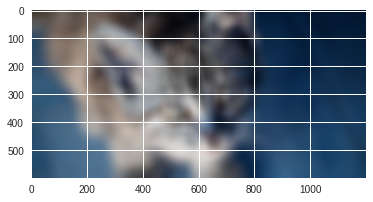

In [18]:
# since the size of the image is large, using larger kernel size(50) and sigma value(20)
# filter2D is used for convolving the image with the kernel
filtered_img = cv2.filter2D(img1, -1,  gaussian_filter(50, 20))
plt.imshow(filtered_img)

## Working with Raw Images
- https://pypi.org/project/rawpy/

In [19]:
! wget -O blackbird.zip https://s3.amazonaws.com/Sample_NEFs/blackbird.nef.zip
! unzip blackbird.zip
! rm blackbird.zip

--2021-02-03 01:24:39--  https://s3.amazonaws.com/Sample_NEFs/blackbird.nef.zip
Resolving s3.amazonaws.com (s3.amazonaws.com)... 52.217.78.22
Connecting to s3.amazonaws.com (s3.amazonaws.com)|52.217.78.22|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 18963882 (18M) [application/zip]
Saving to: ‘blackbird.zip’

blackbird.zip       100%[===================>]  18.08M  21.7MB/s    in 0.8s    

2021-02-03 01:24:41 (21.7 MB/s) - ‘blackbird.zip’ saved [18963882/18963882]

Archive:  blackbird.zip
  inflating: blackbird.nef           


In [20]:
# installing rawpy module
! pip install rawpy

     |████████████████████████████████| 1.7MB 9.0MB/s 


In [21]:
# viewing the raw image
import rawpy
with rawpy.imread('blackbird.nef') as raw:
  rgb_img = raw.postprocess(half_size=True)
  rgb_img1 = raw.postprocess(gamma=(5,2), half_size=True)
  rgb_img2 = raw.postprocess(gamma=(0.5,0.5), half_size=True)

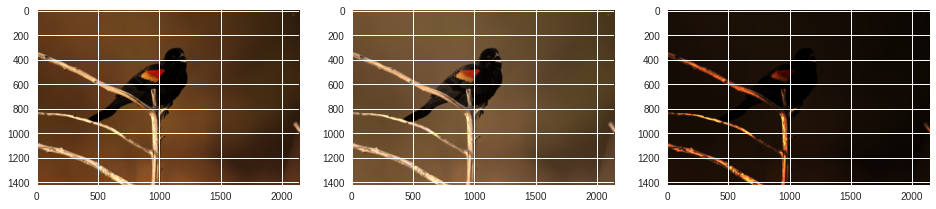

In [22]:
# randomly tweaked the gamma value here
# https://letmaik.github.io/rawpy/api/rawpy.Params.html#rawpy.Params : refer here for description of parameters
fig, ax = plt.subplots(1, 3, figsize=(16,9))
ax[0].imshow(rgb_img1)
ax[1].imshow(rgb_img)
ax[2].imshow(rgb_img2)

*for raw images, read about the sensors and also how the postprocessing steps takes place; this will provide some insights on how to manipulate these images.*
*Additionally, there is an interesting thread for raw image processing [here](https://www.kaggle.com/tsilveira/raw-image-processing).*

---

##Face Detection
- Will be using Haar cascade for face detection
- refer here for more details: https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_objdetect/py_face_detection/py_face_detection.html

In [23]:
! wget https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalcatface.xml
! wget -O cat2.jpg https://static.toiimg.com/thumb/msid-67586673,width-800,height-600,resizemode-75,imgsize-3918697,pt-32,y_pad-40/67586673.jpg

--2021-02-03 01:24:48--  https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalcatface.xml
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 411388 (402K) [text/plain]
Saving to: ‘haarcascade_frontalcatface.xml’

haarcascade_frontal 100%[===================>] 401.75K  --.-KB/s    in 0.02s   

2021-02-03 01:24:49 (17.5 MB/s) - ‘haarcascade_frontalcatface.xml’ saved [411388/411388]

--2021-02-03 01:24:49--  https://static.toiimg.com/thumb/msid-67586673,width-800,height-600,resizemode-75,imgsize-3918697,pt-32,y_pad-40/67586673.jpg
Resolving static.toiimg.com (static.toiimg.com)... 184.86.193.96, 2600:1409:d000:3a4::216f, 2600:1409:d000:3a3::216f
Connecting to static.toiimg.com (static.toiimg.com)|184.86.193.96|:443... connected.
H

In [24]:
face_cascade = cv2.CascadeClassifier('haarcascade_frontalcatface.xml')
img3 = cv2.imread('cat2.jpg')
gray_img3 = cv2.cvtColor(img3, cv2.COLOR_BGR2GRAY)

In [25]:
faces = face_cascade.detectMultiScale(gray_img3, minSize=(200, 200))
for (x ,y ,w ,h) in faces:
    img_face = cv2.rectangle(img3,(x,y),(x+w,y+h),(255,0,0),2)

In [26]:
# checking if faces is empty
faces

array([[256, 101, 307, 307]], dtype=int32)

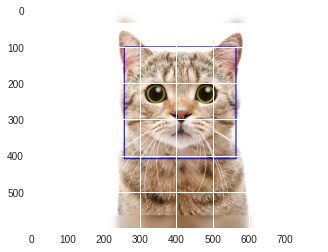

In [27]:
plt.imshow(img_face[:, :, ::-1])

**We can also extend the face detector to videos: https://www.youtube.com/watch?v=88HdqNDQsEk&t=61s**

---